# EDA

In [ ]:
import os, glob, io, math
from pathlib import Path
import pdfplumber
import fitz               # PyMuPDF
import pytesseract
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML
from collections import Counter
import nltk
import regex as re
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

try:
    import umap
    HAVE_UMAP = True
except Exception:
    HAVE_UMAP = False

PDF_FOLDER = "data/"
IMG_FOLDER = "extracted_images/"
TXT_FOLDER = "extracted_text/"
OUT_DIR = "eda_outputs/"
os.makedirs(IMG_FOLDER, exist_ok=True)
os.makedirs(TXT_FOLDER, exist_ok=True)
os.makedirs(OUT_DIR, exist_ok=True)

# !!!!!!!!!!!!!!!!!!!!!!!! pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"



d:\conda_envs\aiapf\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Have UMAP: True
PDF folder: d:\PersonalProjs\2SAF\US_TRADOC\data


In [4]:
def safe_extract_page_text(page):
    try:
        return page.extract_text() or ""
    except Exception:
        return ""

def paragraphs_from_text(text):
    """Heuristic to split text into paragraphs."""
    if not text:
        return []
    t = text.replace("\r\n", "\n").replace("\r", "\n")
    paras = [p.strip() for p in t.split("\n\n") if p.strip()]
    if len(paras) < 2:
        # fallback: combine wrapped lines heuristically
        lines = [l.strip() for l in t.split("\n") if l.strip()]
        paras = []
        buf = ""
        for ln in lines:
            if len(ln) < 80 and buf:
                buf += " " + ln
            else:
                if buf:
                    paras.append(buf.strip())
                buf = ln
        if buf:
            paras.append(buf.strip())
    return paras

def extract_images_with_fitz(pdf_path, img_folder=IMG_FOLDER):
    """Extract images using PyMuPDF; returns list of image metadata dicts."""
    recs = []
    try:
        doc = fitz.open(pdf_path)
        base_name = Path(pdf_path).name
        for page_index, page in enumerate(doc, start=1):
            for img_index, img in enumerate(page.get_images(full=True)):
                xref = img[0]
                base = doc.extract_image(xref)
                img_bytes = base["image"]
                ext = base.get("ext", "png")
                img_name = f"{base_name}_p{page_index}_{img_index}.{ext}"
                img_path = os.path.join(img_folder, img_name)
                with open(img_path, "wb") as f:
                    f.write(img_bytes)
                recs.append({"pdf": base_name, "page": page_index, "img_path": img_path})
    except Exception as e:
        print(f"[WARN] fitz image extraction failed for {pdf_path}: {e}")
    return recs

def ocr_image_to_text(img_path):
    try:
        txt = pytesseract.image_to_string(Image.open(img_path))
        return txt
    except Exception as e:
        print(f"[WARN] OCR failed for {img_path}: {e}")
        return ""
        
def display_scrollable(df, height=400):
    """Display a scrollable HTML table in Jupyter."""
    html = df.to_html(max_rows=200, max_cols=50)
    html = f'<div style="height:{height}px; overflow:auto">{html}</div>'
    display(HTML(html))

nltk.download("punkt")

def clean_text(text):
    """Remove obvious headers/footers and control characters."""
    # Remove page numbers (standalone digits)
    text = re.sub(r'^\s*\d+\s*$', '', text, flags=re.MULTILINE)
    # Remove multiple spaces
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

def looks_like_toc(line):
    """Identify lines that look like TOC entries."""
    if re.match(r".*\.{2,}\s*\d+$", line):  # "Chapter 1 ..... 23"
        return True
    if len(line.split()) < 3:  # very short lines
        return True
    return False

def smart_paragraphs(text, min_words=40):
    """
    Split text into paragraphs:
    - tokenizes into sentences
    - groups sentences until a min word count is reached
    - skips TOC-like fragments
    """
    text = clean_text(text)
    sentences = nltk.sent_tokenize(text)

    paras, current, word_count = [], [], 0
    for sent in sentences:
        if looks_like_toc(sent):
            continue  # skip TOC-like lines
        words = len(sent.split())
        if word_count + words < min_words:
            current.append(sent)
            word_count += words
        else:
            paras.append(" ".join(current + [sent]))
            current, word_count = [], 0
    if current:
        paras.append(" ".join(current))
    return paras


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
doc_records = []
image_records = []
table_frames = []

for pdf_path in sorted(glob.glob(os.path.join(PDF_FOLDER, "*.pdf"))):
    fname = Path(pdf_path).name
    # 1) Text & tables via pdfplumber
    pages_text = []
    try:
        with pdfplumber.open(pdf_path) as pdf:
            for pnum, page in enumerate(pdf.pages, start=1):
                txt = safe_extract_page_text(page)
                pages_text.append(txt)
                # extract tables 
                try:
                    tlist = page.extract_tables() or []
                except Exception:
                    tlist = []
                for t_idx, t in enumerate(tlist):
                    df_t = pd.DataFrame(t)
                    df_t["source"] = fname
                    df_t["page"] = pnum
                    df_t["table_index"] = t_idx
                    table_frames.append(df_t)
    except Exception as e:
        print(f"pdfplumber failed for {fname}: {e}")
        # fallback: try fitz text
        try:
            doc = fitz.open(pdf_path)
            pages_text = [p.get_text("text") or "" for p in doc]
        except Exception as e2:
            print(f"[ERROR] fitz text extraction failed for {fname}: {e2}")
            pages_text = []
    full_text = "\n".join(pages_text)
    paras = paragraphs_from_text(full_text)
    para_word_counts = [len(p.split()) for p in paras] if paras else []
    # 2) images with fitz
    imgs = extract_images_with_fitz(pdf_path, IMG_FOLDER)
    image_records.extend(imgs)
    
    doc_records.append({
        "filename": fname,
        "pages": len(pages_text),
        "words": len(full_text.split()),
        "chars": len(full_text),
        "num_paragraphs": len(paras),
        "avg_para_words": float(np.mean(para_word_counts)) if para_word_counts else 0.0,
        "median_para_words": float(np.median(para_word_counts)) if para_word_counts else 0.0,
        "max_para_words": int(max(para_word_counts)) if para_word_counts else 0,
        "min_para_words": int(min(para_word_counts)) if para_word_counts else 0,
        "image_count": sum(1 for i in imgs if i["pdf"] == fname),
        "raw_text": full_text
    })

df_docs = pd.DataFrame(doc_records)
print("Document-level stats:")
display_scrollable(df_docs)


Cannot set gray non-stroke color because /'P0' is an invalid float value
Cannot set gray non-stroke color because /'P0' is an invalid float value


Document-level stats:


In [6]:
df_docs

,filename,pages,words,chars,num_paragraphs,avg_para_words,median_para_words,max_para_words,min_para_words,image_count,raw_text
0,ARN33331-FM_1-0-000-WEB-1.pdf,204,94353,659060,5278,17.876658,15.5,470,2,18,FM 1-0\nHUMAN RESOURCES\nSUPPORT\nAUGUST 2021\...
1,ARN35404-FM_6-0-000-WEB-1.pdf,224,93777,704367,2,46888.500000,46888.5,93775,2,19,(cid:41)(cid:48) (cid:25)(cid:16)(cid:19)\n(ci...
2,ARN37194-FM_3-98-000-WEB-1.pdf,204,82731,584249,2,41365.500000,41365.5,82729,2,85,FM 3-98\nRECONNAISSANCE AND\nSECURITY OPERATIO...
3,ARN38160-FM_3-90-000-WEB-1.pdf,480,216935,1461977,2,108467.500000,108467.5,216933,2,212,FM 3-90\nTactics\nMAY 2023\nDISTRIBUTION RESTR...
4,ARN38648-FM_3-22-000-WEB-1.pdf,88,37678,264095,2,18839.000000,18839.0,37676,2,11,FM 3-22\nARMY SUPPORT TO\nSECURITY COOPERATION...
5,ARN39048-FM_3-60-000-WEB-1.pdf,158,47771,330817,2,23885.500000,23885.5,47769,2,140,FM 3-60\nArmy Targeting\nAUGUST 2023\nDISTRIBU...
6,ARN39259-FM_2-0-000-WEB-2.pdf,328,146857,1075706,2,73428.500000,73428.5,146855,2,73,FM 2-0\nINTELLIGENCE\nOCTOBER 2023\nDISTRIBUTI...
7,ARN40321-FM_1-02.1-000-WEB-2.pdf,132,68636,477857,2,34318.000000,34318.0,68635,1,4,FM 1-02.1\nOPERATIONAL TERMS\n(cid:41)(cid:40)...
8,ARN43326-FM_3-0-000-WEB-1.pdf,296,145968,1027993,2,72984.000000,72984.0,145966,2,33,FM 3-0\nOPERATIONS\nMARCH 2025\nDISTRIBUTION R...
9,ARN43343-FM_3-04-000-WEB-1.pdf,164,64735,462420,2,32367.500000,32367.5,64733,2,63,FM 3-04\nARMY\nAVIATION\nMARCH 2025\nDISTRIBUT...


Summary Statistics for Images per Document:
count      19.000000
mean      159.210526
std       475.342517
min         4.000000
25%        18.500000
50%        33.000000
75%        68.000000
max      2111.000000
Name: image_count, dtype: float64


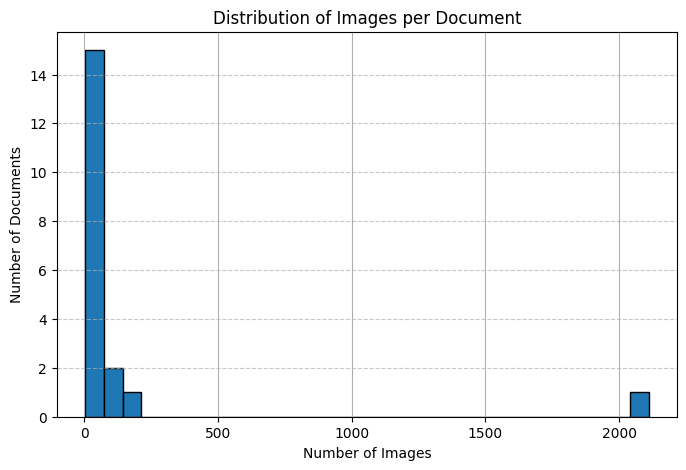

In [ ]:
import matplotlib.pyplot as plt

summary_stats = df_docs['image_count'].describe()
print("Summary Statistics for Images per Document:")
print(summary_stats)

plt.figure(figsize=(8,5))
df_docs['image_count'].hist(bins=30, edgecolor='black')

plt.title("Distribution of Images per Document")
plt.xlabel("Number of Images")
plt.ylabel("Number of Documents")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



We can see that most documents have about 20-70 images. There might be presence of outliers and upon further inspection, we find that the document with 2k+ images is due to every icon being extracted as an indiv image.

### Get word count df for each para

In [8]:
import regex as re

para_rows = []
for _, row in df_docs.iterrows():
    fname = row["filename"]
    text = row["raw_text"]
    paras = smart_paragraphs(text, min_words=40)
    for idx, p in enumerate(paras, start=1):
        para_rows.append({
            "pdf": fname,
            "paragraph_index": idx,
            "paragraph_text": p,
            "word_count": len(p.split()),
            "snippet": p[:140]
        })

df_para = pd.DataFrame(para_rows)
print("Paragraph-level dataframe (first rows):")
display_scrollable(df_para.head(200))
print("Paragraph stats summary:")
display(df_para["word_count"].describe())



Paragraph-level dataframe (first rows):


Paragraph stats summary:


count    29543.000000
mean        53.272484
std         28.480188
min          5.000000
25%         44.000000
50%         49.000000
75%         57.000000
max       1348.000000
Name: word_count, dtype: float64

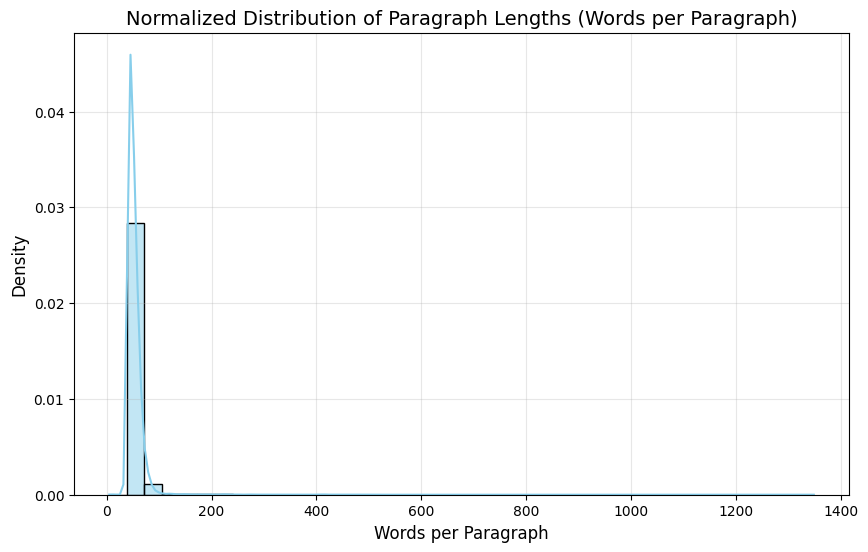

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot normalized histogram with KDE (Kernel Density Estimation)
plt.figure(figsize=(10,6))
sns.histplot(df_para["word_count"], bins=40, kde=True, stat="density", color="skyblue", edgecolor="black")

plt.title("Normalized Distribution of Paragraph Lengths (Words per Paragraph)", fontsize=14)
plt.xlabel("Words per Paragraph", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()


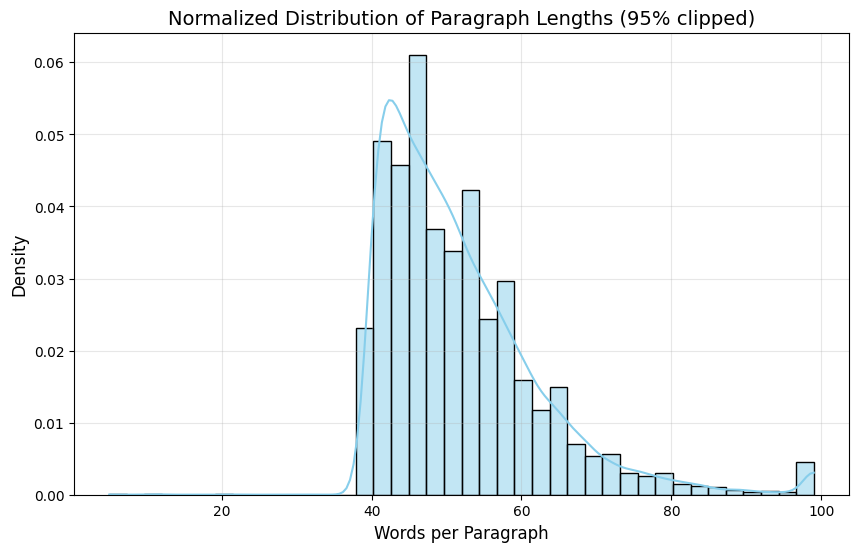

In [10]:
plt.figure(figsize=(10,6))
sns.histplot(
    df_para["word_count"].clip(upper=df_para["word_count"].quantile(0.99)), 
    bins=40, kde=True, stat="density", color="skyblue", edgecolor="black"
)

plt.title("Normalized Distribution of Paragraph Lengths (95% clipped)", fontsize=14)
plt.xlabel("Words per Paragraph", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()


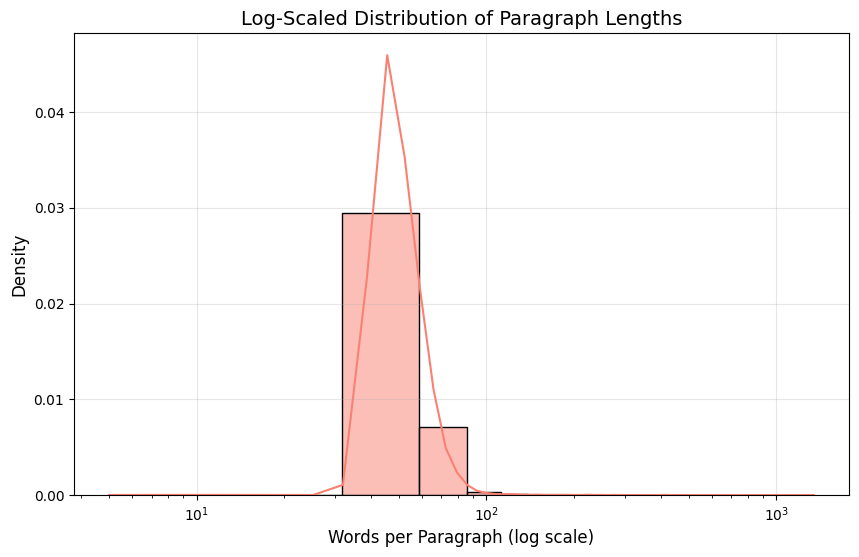

In [11]:
plt.figure(figsize=(10,6))
sns.histplot(df_para["word_count"], bins=50, kde=True, stat="density", color="salmon", edgecolor="black")
plt.xscale("log")

plt.title("Log-Scaled Distribution of Paragraph Lengths", fontsize=14)
plt.xlabel("Words per Paragraph (log scale)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

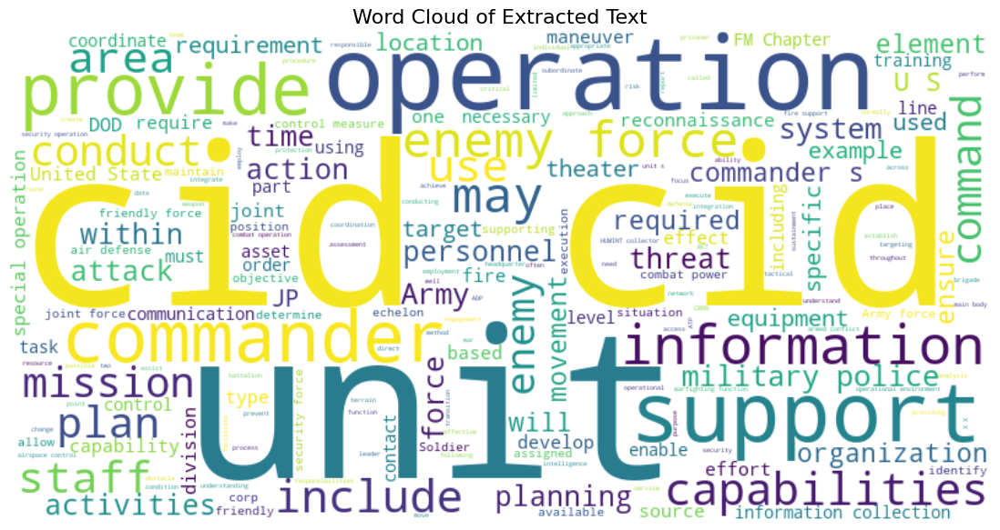

In [26]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all OCR text into one string
all_text = " ".join(df_para["paragraph_text"].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400,
                      background_color='white',
                      colormap='viridis',
                      max_words=200).generate(all_text)

# Display the word cloud
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Extracted Text", fontsize=16)
plt.show()


In [27]:
import re
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

def clean_ocr_text(text):
    if not isinstance(text, str):
        return ""
    text = text.lower()
    text = re.sub(r"[^a-z\s]", " ", text) # Remove non-alphabetic characters
    words = text.split()
    words = [w for w in words if len(w) > 2 and w not in stop_words]     # Remove short words and stopwords

    return " ".join(words)

df_para["cleaned_para_text"] = df_para["paragraph_text"].apply(clean_ocr_text)

print(df_para[["paragraph_text", "cleaned_para_text"]].head(10))


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


                                      paragraph_text  \
0  FM 1-0 HUMAN RESOURCES SUPPORT AUGUST 2021 DIS...   
1  FM 1-0 Field Manual Headquarters No. 1-0 Depar...   
2  This publication supersedes FM 1-0, dated 1 Ap...   
3  Source Notes-1 GLOSSARY .........................   
4  Human resources and sustainment structure rela...   
5  Division G-1 with a human resources operations...   
6  Notional non-unit related personnel replacemen...   
7  Morale, welfare, and recreation support .........   
8  While FM 1-0 is the Army’s primary source of d...   
9  The principal audience for FM 1-0 is all Army ...   

                                   cleaned_para_text  
0  human resources support august distribution re...  
1  field manual headquarters department army wash...  
2  publication supersedes dated april contents un...  
3  source notes glossary glossary references refe...  
4  human resources sustainment structure relation...  
5  division human resources operations center fig... 

### OCR portion

In [12]:
pytesseract.pytesseract.tesseract_cmd = r"D:\tessetact_ocr\tesseract.exe"

img_rows = []
for rec in image_records:
    img_path = rec["img_path"]
    ocr_txt = ocr_image_to_text(img_path)
    img_rows.append({
        "pdf": rec["pdf"],
        "page": rec["page"],
        "img_path": img_path,
        "ocr_text": ocr_txt,
        "ocr_word_count": len(ocr_txt.split())
    })

df_images = pd.DataFrame(img_rows)
if df_images.empty:
    print("No images/OCR text found.")
else:
    print("Image OCR sample:")
    display_scrollable(df_images.head(200))
    df_images.to_csv(os.path.join(OUT_DIR, "image_ocr.csv"), index=False)


Image OCR sample:


,pdf,page,img_path,ocr_text,ocr_word_count
0,ARN33331-FM_1-0-000-WEB-1.pdf,1,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p1_0.jpeg,,0
1,ARN33331-FM_1-0-000-WEB-1.pdf,1,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p1_1.jpeg,,0
2,ARN33331-FM_1-0-000-WEB-1.pdf,15,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p15_0.png,"Provide\nHuman Resources (HR)|\n\nSupport\n\nCore\nCompetencies\n\nMan the Force\n\nPersonnel Essential\nAccounting/ Personnel\nStrength Reporting Services Soordinate\n\nSubordinate Support\n\nKey\nFunctions\n\nHR Support to\nReplacement\nOperations\n\nOperations\n\nCommand\nInterest Programs\nRetention\nOperations\n\nHR Support to\nCasualty\nOperations\n\nArmy Band\nOperations\n\nMorale, Welfare\nand Recreation\nOperations\n\nPersonnel\nReadiness\nManagement\n\n*Personnel Information Management\n* Personnel Information Management (PIM) is the connective force supporting\nthe execution of all HR core competencies and subordinate key functions.\n\n",73
3,ARN33331-FM_1-0-000-WEB-1.pdf,18,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p18_0.jpeg,"ARMY BAND OPERATIONS\nMORALE, WELFARE, AND RECREATION OPERATIONS\n\nPERSONNEL READINESS\nMANAGEMENT\n\ng&\n\nHUMAN RESOURCES SUPPORT\nTo REPLACEMENT OPERATIONS\n\nPersonnel Accountin\nStrength Reporting\n\nHUMAN RESOURCES SUPPORT\nTo CASUALTY OPERATIONS\n\nkK\nz\nWw\nkK\nZz\no | YZ\nwv l/ |2\nwf\ {2\nQa] \JjJoO\n2} {|e\n=\n=\nfe)\n0\n\nPersonnel Information Management\n\nPOSTAL OPERATIONS\n\n",54
4,ARN33331-FM_1-0-000-WEB-1.pdf,20,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p20_0.png,"Strategic Support Area\n\nStrategic\nIntegrators,\nHQDAG-1—\n\nUSAR\n(rited States Army Reserve)\n\nUSARNG\nStates Army National Guard)\n\nHRC\n(aman Resources\nne Command)\n\nae TAGD\n(The Adjutant General Directorate)\n\nDMPM\nirectorate of Military\n—5 Personnel Management)\nS)_\mpsaruses\n“(itary Postal Service Agency\n‘gr US. Postal Service)\n\nLEGEND:\n\nJoint Security Area\n\nConsolidation Area\n\nCorps Support\n\ni\n\n“POD\n\nHR\n\nNeney 'USRe!\n\nThission command stucture:\n\n> = technical direction for PA and postal\n—- SRC63, Sustainment Unit\n\n(*))= sr¢12, Human Resource Support Elements\n(5) = Headquarters Element or Maneuver Element\n\n‘APOD\nASCC\n\neral port of debarkation\nmy Service component command\n\nCL = casualty liaison\nDSB = division sustainment brigade\n\nDSTB\n\nvision sustainment troops battalion\n\nESC = expeditionary sustainment command\n\nHQDA\n\njeadquarters, Department ofthe Army\n\nEa\nTa\n\nHR = human resources (company, platoon, squad or tearn)\n\nDivision Support\nAl\n\n‘POD\n\nMenaey 'USRE\n\nHROB\nHROC\n\nJA, G4, $4\nJTF = joint task force\n\n[E=]\n\nNEARED Hoa:\n\nluman resources operations branch\nman resources operations center\ncordinating staff overseeing personnel support\n\nMMT = military mail terminal (tearn)\nPA = personnel accounting\n\nSPO = support operations\n\nSTB = special troops battalion\n\nSUST = sustainment\n\nTPOC = theater personnel operations center\nTSC = theater sustainment command\n\nUSASOC\n\nnited States Army Special Operations Command\n\n",201
5,ARN33331-FM_1-0-000-WEB-1.pdf,22,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p22_0.png,"Roc\n\nLEGEND:\n\nES- sxc 63, sustainment Unit\nE71 sac 12, Human Resource support elements\nFEF Headquarters Element or Manewver Element\n|} = command relationships\n-> = technical direction for PA and postal\nAASCC= Army Service component command\nBCT= brigade combat team\nN= battalion\nDIV= division\n58 division support brigade\nOSTB-= division sustainment troops bat\nESC= expeditionary sustainment coma\nFA=feld army\n\nG-1/AG= assistant chief of staff, personnel\nR= human resources\nHRo® = human resources operations branch\nHROC= human resources operations center\nMMIT= military mai terminal\n'PAT= personnel accountability team\nS-1= personne staf officer\n'SPO= support operations\nSRC= standard requirements code\nSTB= special troops battalion\nSUST= sustainment\n‘TPOC= theater personn

In [13]:
df_images = df_images[df_images["ocr_word_count"] > 0].reset_index(drop=True)
print("Image OCR sample:")
display_scrollable(df_images.head(200))
df_images.to_csv(os.path.join(OUT_DIR, "image_ocr.csv"), index=False)

Image OCR sample:


,pdf,page,img_path,ocr_text,ocr_word_count
0,ARN33331-FM_1-0-000-WEB-1.pdf,15,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p15_0.png,"Provide\nHuman Resources (HR)|\n\nSupport\n\nCore\nCompetencies\n\nMan the Force\n\nPersonnel Essential\nAccounting/ Personnel\nStrength Reporting Services Soordinate\n\nSubordinate Support\n\nKey\nFunctions\n\nHR Support to\nReplacement\nOperations\n\nOperations\n\nCommand\nInterest Programs\nRetention\nOperations\n\nHR Support to\nCasualty\nOperations\n\nArmy Band\nOperations\n\nMorale, Welfare\nand Recreation\nOperations\n\nPersonnel\nReadiness\nManagement\n\n*Personnel Information Management\n* Personnel Information Management (PIM) is the connective force supporting\nthe execution of all HR core competencies and subordinate key functions.\n\n",73
1,ARN33331-FM_1-0-000-WEB-1.pdf,18,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p18_0.jpeg,"ARMY BAND OPERATIONS\nMORALE, WELFARE, AND RECREATION OPERATIONS\n\nPERSONNEL READINESS\nMANAGEMENT\n\ng&\n\nHUMAN RESOURCES SUPPORT\nTo REPLACEMENT OPERATIONS\n\nPersonnel Accountin\nStrength Reporting\n\nHUMAN RESOURCES SUPPORT\nTo CASUALTY OPERATIONS\n\nkK\nz\nWw\nkK\nZz\no | YZ\nwv l/ |2\nwf\ {2\nQa] \JjJoO\n2} {|e\n=\n=\nfe)\n0\n\nPersonnel Information Management\n\nPOSTAL OPERATIONS\n\n",54
2,ARN33331-FM_1-0-000-WEB-1.pdf,20,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p20_0.png,"Strategic Support Area\n\nStrategic\nIntegrators,\nHQDAG-1—\n\nUSAR\n(rited States Army Reserve)\n\nUSARNG\nStates Army National Guard)\n\nHRC\n(aman Resources\nne Command)\n\nae TAGD\n(The Adjutant General Directorate)\n\nDMPM\nirectorate of Military\n—5 Personnel Management)\nS)_\mpsaruses\n“(itary Postal Service Agency\n‘gr US. Postal Service)\n\nLEGEND:\n\nJoint Security Area\n\nConsolidation Area\n\nCorps Support\n\ni\n\n“POD\n\nHR\n\nNeney 'USRe!\n\nThission command stucture:\n\n> = technical direction for PA and postal\n—- SRC63, Sustainment Unit\n\n(*))= sr¢12, Human Resource Support Elements\n(5) = Headquarters Element or Maneuver Element\n\n‘APOD\nASCC\n\neral port of debarkation\nmy Service component command\n\nCL = casualty liaison\nDSB = division sustainment brigade\n\nDSTB\n\nvision sustainment troops battalion\n\nESC = expeditionary sustainment command\n\nHQDA\n\njeadquarters, Department ofthe Army\n\nEa\nTa\n\nHR = human resources (company, platoon, squad or tearn)\n\nDivision Support\nAl\n\n‘POD\n\nMenaey 'USRE\n\nHROB\nHROC\n\nJA, G4, $4\nJTF = joint task force\n\n[E=]\n\nNEARED Hoa:\n\nluman resources operations branch\nman resources operations center\ncordinating staff overseeing personnel support\n\nMMT = military mail terminal (tearn)\nPA = personnel accounting\n\nSPO = support operations\n\nSTB = special troops battalion\n\nSUST = sustainment\n\nTPOC = theater personnel operations center\nTSC = theater sustainment command\n\nUSASOC\n\nnited States Army Special Operations Command\n\n",201
3,ARN33331-FM_1-0-000-WEB-1.pdf,22,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p22_0.png,"Roc\n\nLEGEND:\n\nES- sxc 63, sustainment Unit\nE71 sac 12, Human Resource support elements\nFEF Headquarters Element or Manewver Element\n|} = command relationships\n-> = technical direction for PA and postal\nAASCC= Army Service component command\nBCT= brigade combat team\nN= battalion\nDIV= division\n58 division support brigade\nOSTB-= division sustainment troops bat\nESC= expeditionary sustainment coma\nFA=feld army\n\nG-1/AG= assistant chief of staff, personnel\nR= human resources\nHRo® = human resources operations branch\nHROC= human resources operations center\nMMIT= military mai terminal\n'PAT= personnel accountability team\nS-1= personne staf officer\n'SPO= support operations\nSRC= standard requirements code\nSTB= special troops battalion\nSUST= sustainment\n‘TPOC= theater personnel operations center\nTSC= theater sustainment command\n\n",114
4,ARN33331-FM_1-0-000-WEB-1.pdf,24,extracted_images/ARN33331-FM_1-0-000-WEB-1.pdf_p24_0.png,"DISTRIBUTION\nMANAGEMENT CENTER

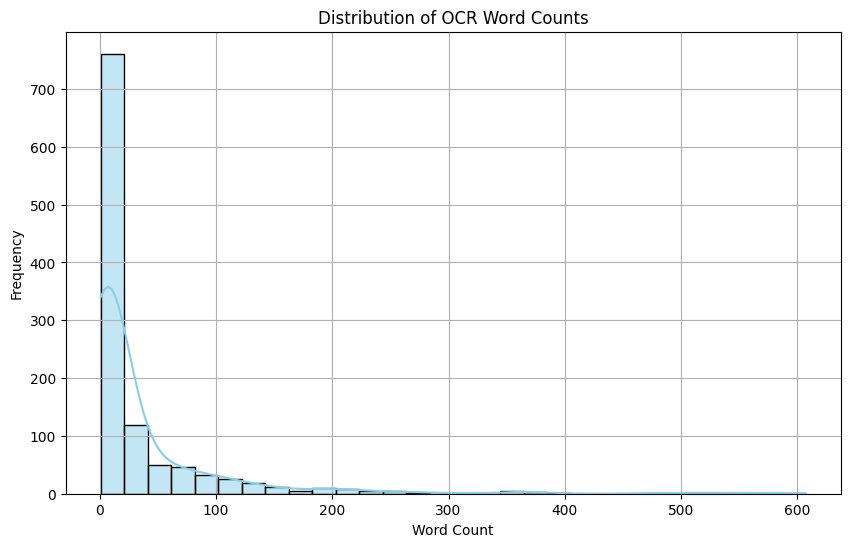

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Make sure df_images exists and has the 'ocr_word_count' column
if not df_images.empty and 'ocr_word_count' in df_images.columns:
    plt.figure(figsize=(10,6))
    sns.histplot(df_images['ocr_word_count'], kde=True, bins=30, color='skyblue')
    plt.title("Distribution of OCR Word Counts")
    plt.xlabel("Word Count")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()
else:
    print("DataFrame is empty or missing 'ocr_word_count' column.")

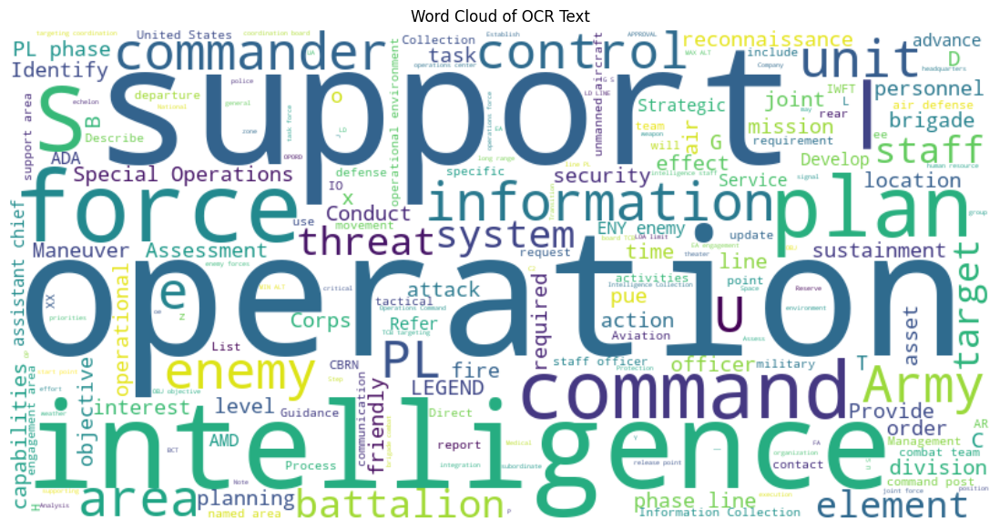

In [15]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all OCR text into one string
all_text = " ".join(df_images['ocr_text'].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400,
                      background_color='white',
                      colormap='viridis',
                      max_words=200).generate(all_text)

# Display the word cloud
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of OCR Text")
plt.show()


In [20]:
df_images['ocr_text']

0       Provide\nHuman Resources (HR)|\n\nSupport\n\nC...
1       ARMY BAND OPERATIONS\nMORALE, WELFARE, AND REC...
2       Strategic Support Area\n\nStrategic\nIntegrato...
3       Roc\n\nLEGEND:\n\nES- sxc 63, sustainment Unit...
4       DISTRIBUTION\nMANAGEMENT CENTER\n\n‘Support Op...
                              ...                        
1112    AMD\n\nArey,\n\nFor the purpose of this figure...
1113    CRC / AWACS a\nControlled airspace [uaRoz_]\n\...
1114    + Process ACMREQs\nand FSCM requests\n\n* Buil...
1115    KK? ro: — — — >\n\nACOIATO B ACOIATO C ACOIATO...
1116                                             flu OY\n
Name: ocr_text, Length: 1117, dtype: object

In [21]:
import re
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

def clean_ocr_text(text):
    if not isinstance(text, str):
        return ""
    text = text.lower()
    text = re.sub(r"[^a-z\s]", " ", text) # Remove non-alphabetic characters
    words = text.split()
    words = [w for w in words if len(w) > 2 and w not in stop_words]     # Remove short words and stopwords

    return " ".join(words)

df_images["cleaned_ocr_text"] = df_images["ocr_text"].apply(clean_ocr_text)

print(df_images[["ocr_text", "cleaned_ocr_text"]].head(10))


                                            ocr_text  \
0  Provide\nHuman Resources (HR)|\n\nSupport\n\nC...   
1  ARMY BAND OPERATIONS\nMORALE, WELFARE, AND REC...   
2  Strategic Support Area\n\nStrategic\nIntegrato...   
3  Roc\n\nLEGEND:\n\nES- sxc 63, sustainment Unit...   
4  DISTRIBUTION\nMANAGEMENT CENTER\n\n‘Support Op...   
5  G-1/AG\nHQ Section\n\nHR Manpower\nHQ Section\...   
6  Legend:\n\nEPS = essential personnel services\...   
7  ssential personnel services\nssistant chief of...   
8  Senior\nMission\n{ Command\n\ VDML\n\n( (Group...   
9  FANN Ain\n\n/ |\n\nStrategic SupportArea Joint...   

                                    cleaned_ocr_text  
0  provide human resources support core competenc...  
1  army band operations morale welfare recreation...  
2  strategic support area strategic integrators h...  
3  roc legend sxc sustainment unit sac human reso...  
4  distribution management center support operati...  
5  section manpower section manpower awards eleme... 

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


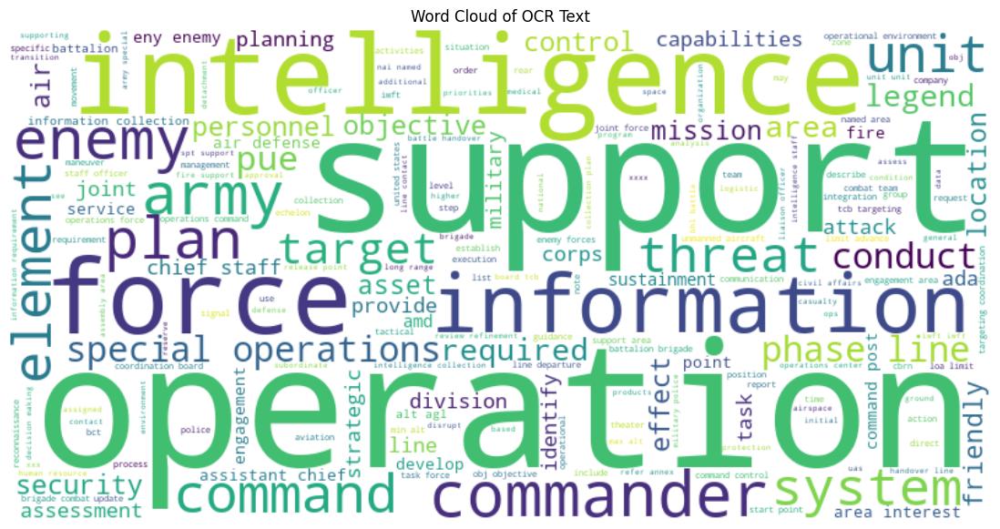

In [23]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all OCR text into one string
all_text = " ".join(df_images['cleaned_ocr_text'].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400,
                      background_color='white',
                      colormap='viridis',
                      max_words=200).generate(all_text)

# Display the word cloud
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of OCR Text")
plt.show()


### Perform Stochastic Neighbour Embedding

In [ ]:
import numpy as np
from nltk.tokenize import word_tokenize
import nltk
import plotly.express as px
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

perplexity = np.arange(5, 55, 5)
divergence = []

nltk.download('punkt')

# Combine OCR and paragraph texts into a single list
texts = df_images['cleaned_ocr_text'].tolist() + df_para['paragraph_text'].tolist()

def preprocess_text(text):
    words = word_tokenize(text.lower())  # Convert to lowercase and tokenize
    return ' '.join([word for word in words if word.isalpha() and word not in ENGLISH_STOP_WORDS])

processed_texts = [preprocess_text(text) for text in texts]

# Vectorization using TF-IDF
vectorizer = TfidfVectorizer(max_features=1000)  # Limit to top 1000 features
X = vectorizer.fit_transform(processed_texts)

for i in perplexity:
    model = TSNE(n_components=2, init="pca", perplexity=i)
    reduced = model.fit_transform(X.toarray())
    divergence.append(model.kl_divergence_)
fig = px.line(x=perplexity, y=divergence, markers=True)
fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
fig.update_traces(line_color="red", line_width=1)
fig.show()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


![image](./perplexity_values.jpg)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


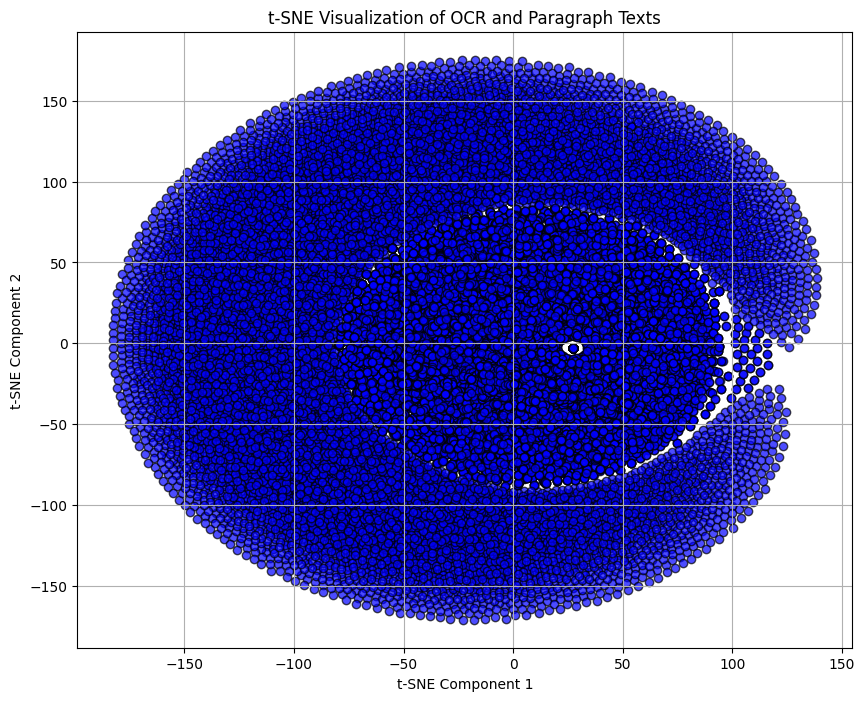

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from nltk.tokenize import word_tokenize
import nltk

nltk.download('punkt')

# Combine OCR and paragraph texts into a single list
texts = df_images['ocr_text'].tolist() + df_para['paragraph_text'].tolist()

# Tokenization and stopword removal
def preprocess_text(text):
    words = word_tokenize(text.lower())  # Convert to lowercase and tokenize
    return ' '.join([word for word in words if word.isalpha() and word not in ENGLISH_STOP_WORDS])

processed_texts = [preprocess_text(text) for text in texts]

# Vectorization using TF-IDF
vectorizer = TfidfVectorizer(max_features=1000)  # Limit to top 1000 features
X = vectorizer.fit_transform(processed_texts)

# Reduce dimensions with PCA before applying t-SNE
# pca = PCA(n_components=50)
# X_pca = pca.fit_transform(X.toarray())

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30) # To see above perplexity plot and choose value where divergence is low and stable
X_tsne = tsne.fit_transform(X.toarray())
# X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X.toarray())


# Create a DataFrame for the t-SNE results
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])

# Plotting the t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(df_tsne['TSNE-1'], df_tsne['TSNE-2'], c='blue', edgecolor='k', alpha=0.7)
plt.title("t-SNE Visualization of OCR and Paragraph Texts")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.grid(True)
plt.show()


t-SNE might not be very compatible since there are 30660 samples and this will take very long. The perplexity graph also does not show a good perplexity value we could use (since the general rule is perplexity = num_samples / 3, which will be about 10k)

### Try UMAP

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ianwa\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


TF-IDF shape: (30660, 20000)


d:\conda_envs\aiapf\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


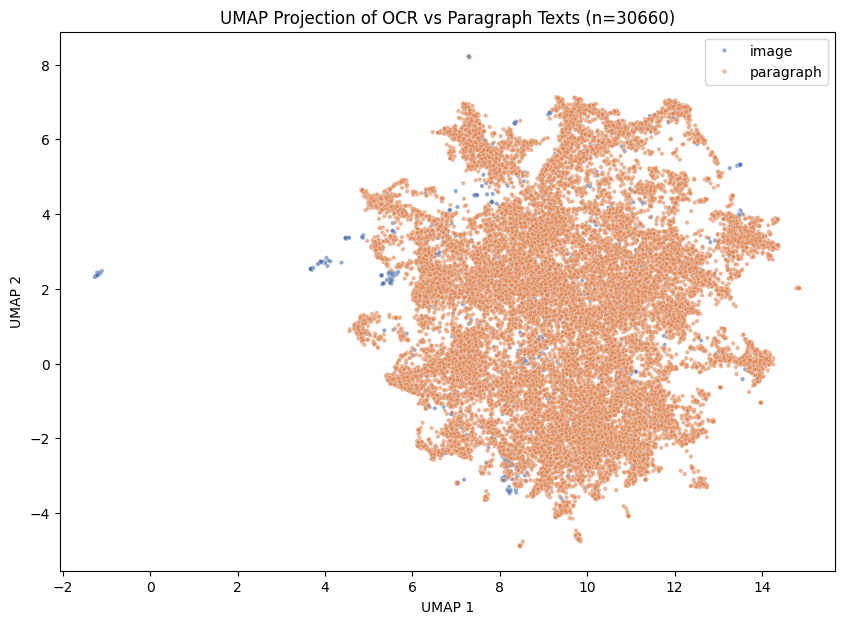

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS
import umap.umap_ as umap

nltk.download('punkt')

# ---------- Parameters ----------
MAX_TFIDF_FEATURES = 20000   # how many top terms to keep
UMAP_N_NEIGHBORS = 15        # controls local vs global structure
UMAP_MIN_DIST = 0.1          # tighter (0.0) vs looser (0.5) clusters
UMAP_DIMS = 2                # 2D embedding for visualization
RANDOM_STATE = 42

# ---------- Prepare text ----------
all_texts = pd.concat([df_images['cleaned_ocr_text'], df_para['cleaned_para_text']], ignore_index=True)
sources = (['image'] * len(df_images)) + (['paragraph'] * len(df_para))

def preprocess_text(text):
    words = word_tokenize(str(text).lower())
    return ' '.join([w for w in words if w.isalpha() and w not in ENGLISH_STOP_WORDS])

processed_texts = [preprocess_text(t) for t in all_texts]

vectorizer = TfidfVectorizer(max_features=MAX_TFIDF_FEATURES, stop_words="english")
X_tfidf = vectorizer.fit_transform(processed_texts)
print("TF-IDF shape:", X_tfidf.shape)

reducer = umap.UMAP(
    n_neighbors=UMAP_N_NEIGHBORS,
    min_dist=UMAP_MIN_DIST,
    n_components=UMAP_DIMS,
    random_state=RANDOM_STATE,
    metric='cosine'
)
X_umap = reducer.fit_transform(X_tfidf)

# ---------- Visualization ----------
df_vis = pd.DataFrame(X_umap, columns=['x', 'y'])
df_vis['source'] = sources

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_vis, x='x', y='y', hue='source', alpha=0.6, s=10, palette='deep')
plt.title(f"UMAP Projection of OCR vs Paragraph Texts (n={len(processed_texts)})")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend()
plt.show()


In [30]:
df_para['cleaned_para_text']

0        human resources support august distribution re...
1        field manual headquarters department army wash...
2        publication supersedes dated april contents un...
3        source notes glossary glossary references refe...
4        human resources sustainment structure relation...
                               ...                        
29538    see develop air national guard aags format pag...
29539    air traffic service coordination air traffic s...
29540    information displays responsibilities digital ...
29541    planned support effects management joint force...
29542    supervision theater army responsibilities unma...
Name: cleaned_para_text, Length: 29543, dtype: object

In [31]:
df_images['cleaned_ocr_text']

0       provide human resources support core competenc...
1       army band operations morale welfare recreation...
2       strategic support area strategic integrators h...
3       roc legend sxc sustainment unit sac human reso...
4       distribution management center support operati...
                              ...                        
1112    amd arey purpose figure division senior tactic...
1113    crc awacs controlled airspace uaroz coordinati...
1114    process acmreqs fscm requests build acms appro...
1115    acoiato acoiato acoiatod pushed pushed pushed ...
1116                                                  flu
Name: cleaned_ocr_text, Length: 1117, dtype: object

### Trying out SentenceBERT

Batches: 100%|██████████| 959/959 [01:45<00:00,  9.06it/s]
d:\conda_envs\aiapf\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


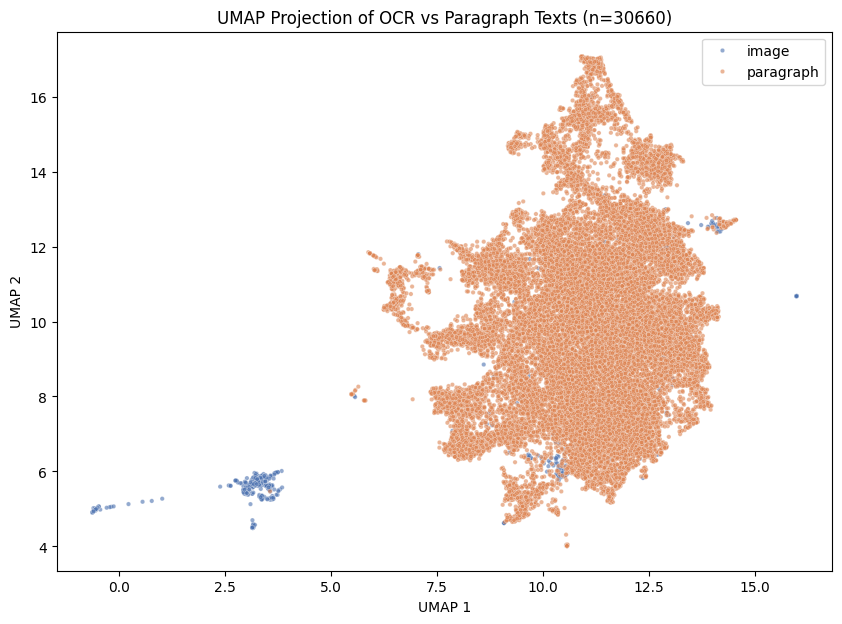

In [35]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("all-MiniLM-L6-v2")
X_embed = model.encode(processed_texts, show_progress_bar=True)

reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, n_components=2, random_state=42, metric="cosine")
X_umap = reducer.fit_transform(X_embed)

df_vis = pd.DataFrame(X_umap, columns=['x', 'y'])
df_vis['source'] = sources

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_vis, x='x', y='y', hue='source', alpha=0.6, s=10, palette='deep')
plt.title(f"UMAP Projection of OCR vs Paragraph Texts (n={len(processed_texts)})")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend()
plt.show()


## Text quality EDA

In [36]:
df_para

,pdf,paragraph_index,paragraph_text,word_count,snippet,cleaned_para_text
0,ARN33331-FM_1-0-000-WEB-1.pdf,1,FM 1-0 HUMAN RESOURCES SUPPORT AUGUST 2021 DIS...,48,FM 1-0 HUMAN RESOURCES SUPPORT AUGUST 2021 DIS...,human resources support august distribution re...
1,ARN33331-FM_1-0-000-WEB-1.pdf,2,FM 1-0 Field Manual Headquarters No. 1-0 Depar...,278,FM 1-0 Field Manual Headquarters No. 1-0 Depar...,field manual headquarters department army wash...
2,ARN33331-FM_1-0-000-WEB-1.pdf,3,"This publication supersedes FM 1-0, dated 1 Ap...",643,"This publication supersedes FM 1-0, dated 1 Ap...",publication supersedes dated april contents un...
3,ARN33331-FM_1-0-000-WEB-1.pdf,4,Source Notes-1 GLOSSARY .........................,46,Source Notes-1 GLOSSARY .........................,source notes glossary glossary references refe...
4,ARN33331-FM_1-0-000-WEB-1.pdf,5,Human resources and sustainment structure rela...,47,Human resources and sustainment structure rela...,human resources sustainment structure relation...
...,...,...,...,...,...,...
29538,FM 3-52 FINAL WEB.pdf,714,"See develop, 3-36–3-37 Air National Guard, G-1...",83,"See develop, 3-36–3-37 Air National Guard, G-1...",see develop air national guard aags format pag...
29539,FM 3-52 FINAL WEB.pdf,715,"air traffic service, coordination, air traffic...",296,"air traffic service, coordination, air traffic...",air traffic service coordination air traffic s...
29540,FM 3-52 FINAL WEB.pdf,716,"information displays, D-14– responsibilities o...",283,"information displays, D-14– responsibilities o...",information displays responsibilities digital ...
29541,FM 3-52 FINAL WEB.pdf,717,"planned support, 3-33–3-35 effects of, A-7–A-8...",267,"planned support, 3-33–3-35 effects of, A-7–A-8...",planned support effects management joint force...


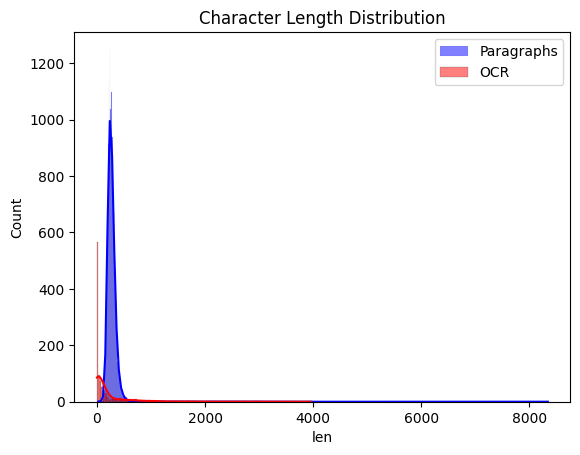

Sample junk words: ['danube', 'iskander', 'ademy', 'tapo', 'pliron', 'paps', 'reparation', 'brsene', 'dave', 'sectio', 'suoisinig', 'decisionmakers', 'geveioped', 'jennauew', 'sumatra', 'ast', 'hhq', 'lote', 'cgy', 'plbronson']
count    1117.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: junk_ratio, dtype: float64


In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import re

# Character-level stats
df_para['len'] = df_para['cleaned_para_text'].str.len()
df_images['len'] = df_images['cleaned_ocr_text'].str.len()

sns.histplot(df_para['len'], color="blue", label="Paragraphs", kde=True)
sns.histplot(df_images['len'], color="red", label="OCR", kde=True)
plt.legend()
plt.title("Character Length Distribution")
plt.show()

# Top junk words (OCR words not in paragraphs)
para_words = set(" ".join(df_para['cleaned_para_text']).split())
ocr_words = set(" ".join(df_images['cleaned_ocr_text']).split())
junk_words = ocr_words - para_words
print("Sample junk words:", list(junk_words)[:20])

# Non-alphabetic ratio
def junk_ratio(text):
    tokens = text.split()
    return sum(1 for t in tokens if not t.isalpha()) / (len(tokens)+1e-9)

df_images['junk_ratio'] = df_images['cleaned_ocr_text'].apply(junk_ratio)
print(df_images['junk_ratio'].describe())


## Semantic Similarity EDA

Batches: 100%|██████████| 35/35 [00:03<00:00,  9.64it/s]


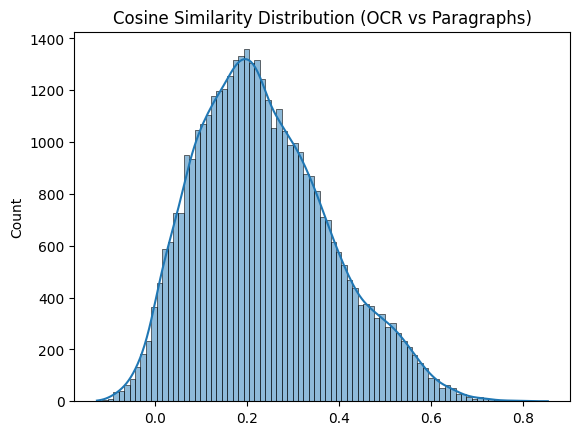

Top-1 retrieval success: 47/50 (94.00%)


In [ ]:
from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('all-MiniLM-L6-v2')

para_embeds = model.encode(df_para['cleaned_para_text'].tolist(), show_progress_bar=True)
ocr_embeds = model.encode(df_images['cleaned_ocr_text'].tolist(), show_progress_bar=True)

cos_sims = util.cos_sim(ocr_embeds[:200], para_embeds[:200])  # sample to save time
sns.histplot(cos_sims.flatten().cpu().numpy(), kde=True)
plt.title("Cosine Similarity Distribution (OCR vs Paragraphs)")
plt.show()

# Top-k retrieval test (does OCR retrieve a similar paragraph?)
hits = 0
for i, ocr_vec in enumerate(ocr_embeds[:50]):
    sims = util.cos_sim(ocr_vec, para_embeds)[0]
    top_idx = sims.argmax().item()
    if sims[top_idx] > 0.5:
        hits += 1
print(f"Top-1 retrieval success: {hits}/50 ({hits/50:.2%})")


- The histogram shows that the most of the scores lie between 0.1 and 0.3, showing that there is not many semantically similar texts between OCR and paragraph texts. This might be due to the OCR-extracted texts generally containing more acronyms and short-forms, compared to the whole paragraphs within tradoc.

- We see from the Top-1 retrieval success that 47/50 of the OCR texts had a cosine similarity of more than 0.5

## Clustering and Topic EDA

In [39]:
from sklearn.cluster import KMeans
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# K-means on embeddings
kmeans = KMeans(n_clusters=5, random_state=42).fit(para_embeds)
df_para['cluster'] = kmeans.labels_

# Topic modeling with LDA
count_vec = CountVectorizer(max_df=0.9, min_df=10, stop_words="english")
X_count = count_vec.fit_transform(df_para['cleaned_para_text'])

lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X_count)

for idx, topic in enumerate(lda.components_):
    top_words = [count_vec.get_feature_names_out()[i] for i in topic.argsort()[-10:]]
    print(f"Topic {idx}: {', '.join(top_words)}")


Topic 0: friendly, unit, operations, area, security, reconnaissance, units, forces, force, enemy
Topic 1: defense, force, airspace, control, support, joint, forces, army, air, operations
Topic 2: targeting, support, staff, collection, commander, police, military, operations, information, intelligence
Topic 3: cbrn, theater, staff, unit, operations, command, personnel, army, support, cid
Topic 4: military, collector, intelligence, table, control, unit, security, source, information, humint


Here we create a new column called 'cluster', which is a topic id (ranging from 0 to 4) for the embedding of that chunk of text.

Maybe the topics can be as follows (?):
- Topic 0 -> ground based ops
- Topic 1 -> air based ops
- Topic 2 -> intel ops
- Topic 3 -> chemical, bio, radio, nuclear ops
- Topic 4 -> HUMINT

## Tokens and stuff EDA

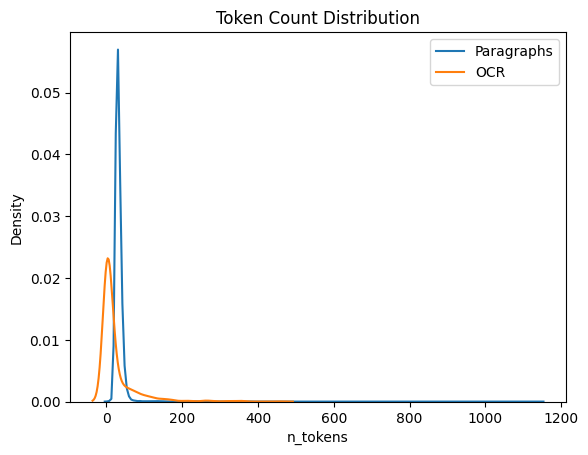

Paragraph avg tokens: 33.39464509359239
OCR avg tokens: 23.830796777081467


In [40]:
# Token counts
df_para['n_tokens'] = df_para['cleaned_para_text'].str.split().str.len()
df_images['n_tokens'] = df_images['cleaned_ocr_text'].str.split().str.len()

sns.kdeplot(df_para['n_tokens'], label="Paragraphs")
sns.kdeplot(df_images['n_tokens'], label="OCR")
plt.title("Token Count Distribution")
plt.legend()
plt.show()

print("Paragraph avg tokens:", df_para['n_tokens'].mean())
print("OCR avg tokens:", df_images['n_tokens'].mean())


% OCR retrievable above 0.4: 93.00%


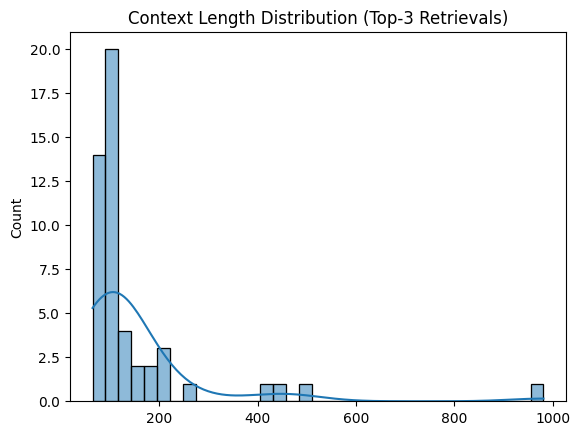

In [42]:
# For each OCR snippet, check if any para passes similarity threshold
threshold = 0.4
retrievable = []
for ocr_vec in ocr_embeds[:200]:
    sims = util.cos_sim(ocr_vec, para_embeds)[0]
    retrievable.append((sims > threshold).any().item())

print(f"% OCR retrievable above {threshold}: {np.mean(retrievable)*100:.2f}%")

# Context length distribution
def topk_context_lengths(k=5):
    lengths = []
    for ocr_vec in ocr_embeds[:50]:
        sims = util.cos_sim(ocr_vec, para_embeds)[0]
        top_idx = sims.topk(k).indices.cpu().numpy()
        lengths.append(df_para.iloc[top_idx]['cleaned_para_text'].str.split().str.len().sum())
    return lengths

context_lengths = topk_context_lengths(k=3)
sns.histplot(context_lengths, kde=True)
plt.title("Context Length Distribution (Top-3 Retrievals)")
plt.show()



In [48]:
!jupyter nbconvert --to script eda.ipynb

[NbConvertApp] Converting notebook eda.ipynb to script
[NbConvertApp] Writing 25546 bytes to eda.py
